In [9]:
import numpy as np
import glob, os
from equations_of_state.iapws_boundaries \
        import plot_boundaries_plotly

In [3]:
import batch_test_latent_sim as bt
import plotting_routines as pr

In [11]:
hub = "/Users/afq/Google Drive/networks/"
def all_eoses(hub):
    eos_dirs = glob.glob(hub+'training_*')
    return [ k[(len(hub)+len('training_')):] for k in eos_dirs ]
def all_archs(hub,eos):
    directory = hub+'/training_'+eos
    archs = os.listdir(directory)
    return archs
eoses = all_eoses(hub)
eos_arch = { k:all_archs(hub,k) for k in eoses}

In [18]:
reference_solutions = {
    'Liquid_Drain':'reference_solutions/Liquid_Drain.csv'
    }

In [13]:
eoses[1]

'water_iapws_rh_lg'

In [80]:
eos_arch[eoses[1]]

['Classifying_pT_0.0_1,1,3,2,sigmoid',
 'Classifying_rhoh_0.0_1,1,3,2,sigmoid',
 'Classifying_rand_0.0_1,2,6,12,sigmoid',
 'Classifying_rhoh_0.0_1,1,3,3,sigmoid',
 'Classifying_pT_0.0_1,1,3,3,sigmoid',
 'Classifying_rand_0.0_1,3,6,12,sigmoid',
 'Classifying_rand_0.0_1,3,3,3,sigmoid',
 'Classifying_pT_0.0_1,3,6,12,sigmoid',
 'Classifying_rhoh_0.0_1,3,3,5,sigmoid',
 'Classifying_pT_0.0_1,3,3,5,sigmoid',
 'Classifying_rhoh_0.0_1,2,6,12,sigmoid',
 'Classifying_pT_0.0_1,2,6,12,sigmoid',
 'Classifying_rhoh_0.0_1,3,6,12,sigmoid',
 'Classifying_pT_0.0_1,3,3,4,sigmoid',
 'Classifying_rhoh_0.0_1,3,3,4,sigmoid',
 'Classifying_rand_0.0_1,1,3,3,sigmoid',
 'Classifying_rhoh_0.0_1,1,6,12,sigmoid',
 'Classifying_pT_0.0_1,1,6,12,sigmoid',
 'Classifying_rand_0.0_1,1,3,2,sigmoid',
 'Classifying_rand_0.0_1,1,6,12,sigmoid',
 'Classifying_rand_0.0_1,3,3,4,sigmoid',
 'Classifying_pT_0.0_1,3,3,3,sigmoid',
 'Classifying_rhoh_0.0_1,3,3,3,sigmoid',
 'Classifying_rand_0.0_1,3,3,5,sigmoid']

In [17]:
time_series, ls_obj = bt.run_one_simulation(
    eoses[1],eos_arch[eoses[1]][1],'Liquid_Drain',verbose=False)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from /Users/afq/Google Drive/networks/training_water_iapws_rh_lg/Classifying_rhoh_0.0_1,1,3,2,sigmoid/final_variables
2.0 71 1.9138172133211866e-07
4.0 71 1.9138171709748692e-07
6.0 71 1.913817128405808e-07
8.0 71 1.9138170862822564e-07
10.0 71 1.9138170441587126e-07
12.0 71 1.9138170018124264e-07
14.0 71 1.913816959243395e-07
16.0 71 1.91381691711987e-07
18.0 71 1.9138168747736036e-07
20.0 71 1.9138168322045973e-07
22.0 71 1.913816790081096e-07
24.0 71 1.9138167475121043e-07
26.0 71 1.9138167049431194e-07
28.0 71 1.9138166628196387e-07
30.0 71 1.91381662025067e-07
32.0 71 1.9138165779044541e-07
34.0 71 1.913816535112749e-07
36.0 71 1.9138164929892972e-07
38.0 71 1.9138164504203557e-07
40.0 71 1.913816408074171e-07
42.0 71 1.9138163655052466e-07
44.0 71 1.913816322936328e-07
46.0 71 1.91381628

In [37]:
import plotly.offline as py
from plotly import tools as pytools
import plotly.graph_objs as go
py.init_notebook_mode()

In [48]:
ref_file = reference_solutions['Liquid_Drain']
ref_arr = np.loadtxt(ref_file,skiprows=1,delimiter=",")

In [55]:
!head reference_solutions/Liquid_Drain.csv

time,State,P,T,Sgas,Saqu,Hgas,Haqu,rho_gas,rho_aqu
0.1,1,276115,99.9983,0,1,0,419223,0,958.437
0.2,1,252232,99.9967,0,1,0,419198,0,958.427
0.3,1,228350,99.995,0,1,0,419174,0,958.417
0.4,1,204469,99.9934,0,1,0,419149,0,958.407
0.5,1,180590,99.9917,0,1,0,419124,0,958.397
0.6,1,156713,99.9901,0,1,0,419099,0,958.387
0.7,1,132837,99.9884,0,1,0,419074,0,958.377
0.8,1,108962,99.9868,0,1,0,419049,0,958.367
0.9,2,101368,99.9861,7.18098e-06,0.999993,2.67555e+06,419041,0.59786,958.364


In [74]:
def prep_ref(arr):
    # The columns are: t, state, P,T. Need to compute rho and rhoH
    t = arr[:,0]
    P = arr[:,2]
    T = arr[:,3] + 273.15
    Sg = arr[:,4]
    Sa = arr[:,5]
    Hg = arr[:,6]
    Ha = arr[:,7]
    rhog = arr[:,8]
    rhoa = arr[:,9]
    rho = rhog*Sg+rhoa*Sa
    rho_h = rhog*Hg*Sg + rhoa*Ha*Sa
    return np.vstack([t,T,P,rho,rho_h]).T

In [81]:
from collections import defaultdict
colorkey = defaultdict(lambda : next(pr.color_ring))

In [82]:
legends=['T','p','rho','rho*h']
subfig = pytools.make_subplots(rows=len(legends),cols=1,
                              shared_xaxes=True)
ref_arr_prep = prep_ref(ref_arr)
for i,name in enumerate(legends):
    trace_ref = go.Scatter(x=ref_arr_prep[:,0],
                          y=ref_arr_prep[:,i+1],
                          name='ref',legendgroup='ref',
                          showlegend=i==0,
                          line=dict(dash='dash',color=colorkey['ref']))
    subfig.append_trace(trace_ref,i+1,1)
    n = 'a'
    trace = go.Scatter(x=time_series[:,0],y=time_series[:,i+3],
                       name=n,legendgroup=n,
                       line=dict(color=colorkey[n]),
                       showlegend=i==0)
    subfig.append_trace(trace,i+1,1)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]
[ (4,1) x1,y4 ]



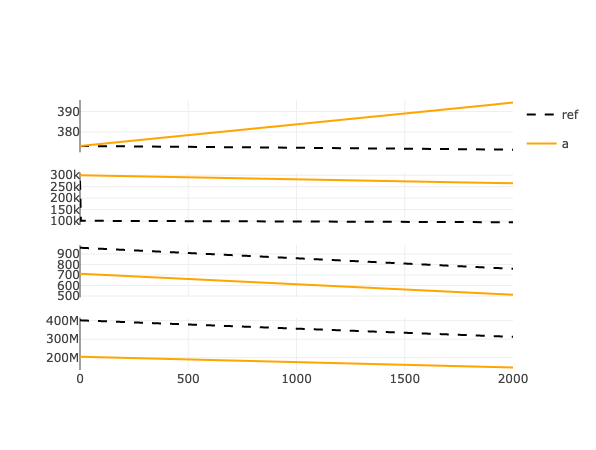

In [83]:
py.iplot(subfig)

In [25]:
trace_bound = plot_boundaries_plotly()

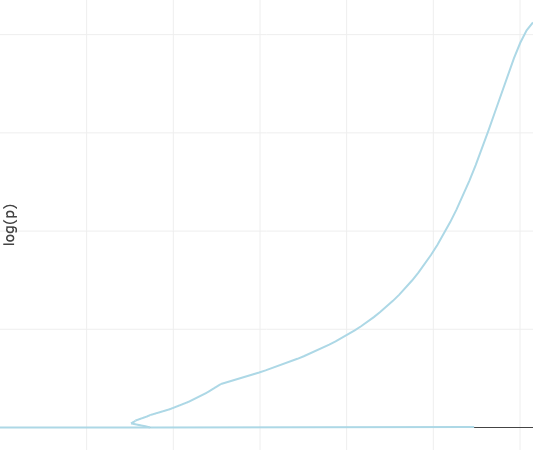

In [35]:
layout=dict(margin=dict(t=0,b=0,l=0,r=0),
            yaxis=dict(title='log(p)') )
py.iplot(go.Figure(trace_bound,layout=layout))